#BLIP (Boostrapping Langauge-Image Pretraining)
BLIP represents a significant advancement in the intersection of natural language processing (NLP) and computer vision. BLIP, designed to improve AI models, enhances their ability to understand and generate image descriptions. It learns to associate images with relevant text, allowing it to generate captions, answer image-related questions, and support image-based search queries.

In [1]:
!pip install transformers

In [2]:
from transformers import BlipProcessor, BlipForConditionalGeneration
from PIL import Image

Base model

In [4]:
#INitialize the processor and model from hugging face
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

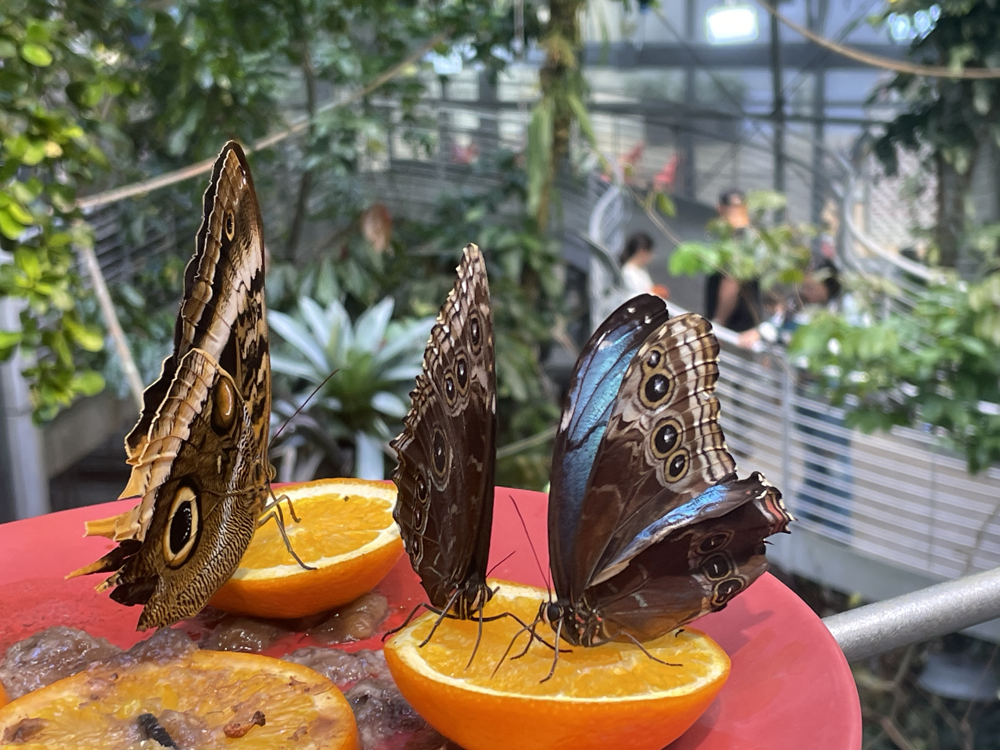

In [29]:
#loading the image
image = Image.open("/content/IMG_0077.JPG")
display(image)

In [30]:
#Prepare the image
inputs = processor(image,return_tensors="pt")

In [31]:
#Genrate captions
outputs = model.generate(**inputs)
caption = processor.decode(outputs[0],skip_specail_tokens=True)
print("Generated Captions: ", caption)

Generated Captions:  butterflies on an orange slice with a butterfly on the side [SEP]


large model

In [32]:
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-large")
model= BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-large")

In [33]:
image = image.convert('RGB')

In [34]:
#conditional captioning
text ="a photo of "
inputs = processor(image, text, return_tensors="pt")


In [35]:
out =model.generate(**inputs)
print(processor.decode(out[0],skip_specail_tokens=True))


a photo of a group of butterflies sitting on top of an orange [SEP]


In [36]:
#unconditional captioning
inputs= processor(image,return_tensors="pt")
out= model.generate(**inputs)
print(processor.decode(out[0],skip_specail_tokens=True))


butterflies on an orange slice with a butterfly on the side [SEP]


#Visual Question Answering

Salesforce/blip-vqa-base

In [43]:
from transformers import BlipForQuestionAnswering

In [44]:
processor = BlipProcessor.from_pretrained("Salesforce/blip-vqa-base")
model =BlipForQuestionAnswering.from_pretrained("Salesforce/blip-vqa-base")

In [45]:
# Define the question for VQA
question = "How many butterfly in the picture?"

# Prepare the inputs for the model
inputs = processor(image, question, return_tensors="pt")

# Generate the answer using the model
outputs = model.generate(**inputs)
answer = processor.decode(outputs[0], skip_special_tokens=True)

print("Generated Answer:", answer)

Generated Answer: 3


/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1168: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(
